# Задание 2 (для самостоятельной работы)

## Поиск минимумов с помощью градиентного спуска

### Задача - найти минимумы функции f(x, y) с помощью градиентного спуска.

In [1]:
import numpy as np
from numpy import pi, sin, exp, log
import plotly.graph_objects as go
import matplotlib.pyplot as plot

In [2]:
def f(x,y):
    return 10*((x)**5 + pi)*sin(log(((y)**4)+1))/exp(0.8*x**2) + x*5 + 1*(1 - x)**2 - y*2

### Введем константы.

In [3]:
global_epsilon = 0.000000001                # argument increment for derivative
radius = 8                                  # working plane radius
centre = (global_epsilon, global_epsilon)   # centre of the working circle
arr_shape = 100                             # number of points processed / 360
step = radius / arr_shape                   # step between two points

### Функция для поворота вектора.

In [4]:
def rotate_vector(length, a):
    return length * np.cos(a), length * np.sin(a)

### Функция рассчета производной по оси oY (eps = y)

In [5]:
def derivative_y(epsilon, arg):
    return (f(arg, epsilon + global_epsilon) - f(arg, epsilon)) / global_epsilon

### Рассчет производной по oX

In [6]:
def derivative_x(epsilon, arg):
    return (f(global_epsilon + epsilon, arg) - f(epsilon, arg)) / global_epsilon

### Возвращает массив локальных минимумов

In [7]:
def calculate_flip_points():
    flip_points = np.array([0, 0])
    points = np.zeros((360, arr_shape), dtype=bool)
    cx, cy = centre

    for i in range(arr_shape):
        for alpha in range(360):
            x, y = rotate_vector(step, alpha)
            x = x * i + cx
            y = y * i + cy
            points[alpha][i] = derivative_x(x, y) + derivative_y(y, x) > 0
            if not points[alpha][i - 1] and points[alpha][i]:
                flip_points = np.vstack((flip_points, np.array([alpha, i - 1])))

    return flip_points

### Выбираем оптимальное значение из точек минимумов

In [8]:
def pick_estimates(positions):
    vx, vy = rotate_vector(step, positions[1][0])
    cx, cy = centre
    best_x, best_y = cx + vx * positions[1][1], cy + vy * positions[1][1]

    for index in range(2, len(positions)):
        vx, vy = rotate_vector(step, positions[index][0])
        x, y = cx + vx * positions[index][1], cy + vy * positions[index][1]
        if f(best_x, best_y) > f(x, y):
            best_x = x
            best_y = y

    for index in range(360):
        vx, vy = rotate_vector(step, index)
        x, y = cx + vx * (arr_shape - 1), cy + vy * (arr_shape - 1)
        if f(best_x, best_y) > f(x, y):
            best_x = x
            best_y = y

    return best_x, best_y

### Сам метод градиентного спуска

In [9]:
def gradient_descent(best_estimates, is_x):
    derivative = derivative_x if is_x else derivative_y
    best_x, best_y = best_estimates
    descent_step = step
    value = derivative(best_y, best_x)

    while abs(value) > global_epsilon:
        descent_step *= 0.95
        best_y = best_y - descent_step \
            if derivative(best_y, best_x) > 0 else best_y + descent_step
        value = derivative(best_y, best_x)

    return best_y, best_x

### Нахождение точки минимума

In [10]:
def find_minimum():
    return gradient_descent(gradient_descent(pick_estimates(calculate_flip_points()), False), True)

In [11]:
def draw_chart(point):
    n_points = 400
    x_range = (-5, 5)
    y_range = (-5, 5)

    X = np.linspace(x_range[0], x_range[1], n_points)
    Y = np.linspace(y_range[0], y_range[1], n_points)

    Z = np.zeros((n_points, n_points))
    for i, x in enumerate(X):
        for j, y in enumerate(Y):
            Z[j][i] = f(x, y)
    
    x, y, z = minimum
    scatter_dict = {
        'x':[float(x)],
        'y':[float(y)],
        'z':[float(z)],
        'mode':'markers',
        'marker':go.scatter3d.Marker(color='green'),
    }

    fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y), go.Scatter3d(**scatter_dict)])
    fig.update_layout(title='f(x,y) 3D plot', autosize=False,
                      width=1000, height=1000)


    fig.show()

(-0.05761390345066797, 3.284635397725483, -37.027090239286075)


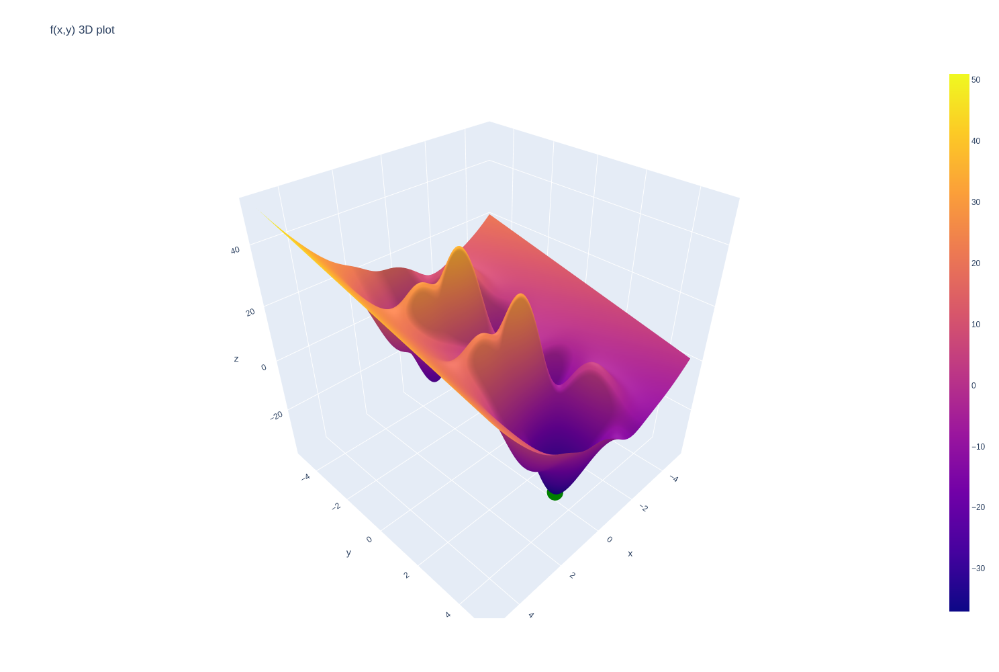

In [12]:
min_x, min_y = find_minimum()
minimum = (min_x, min_y, f(min_x, min_y))

print(minimum)
    
draw_chart(minimum)